In [3]:
import openai
from dotenv import dotenv_values
import requests
import os

from IPython.core.display import Image

In [2]:
config = dotenv_values(".env")
openai.api_key = config["OPENAI_API_KEY"]

In [4]:
skijoer = open("./images/skijoer6.png", "rb").read()

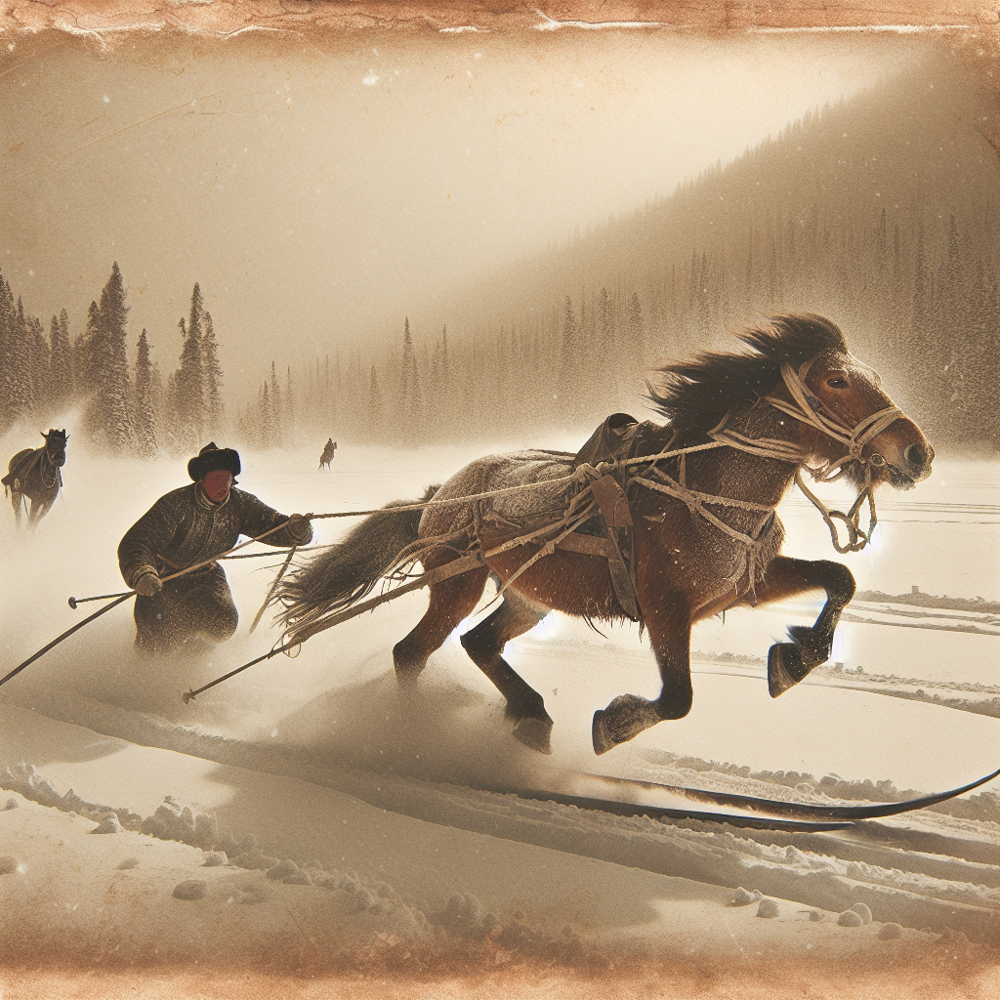

In [6]:
Image(skijoer, width=256)

In [8]:
skijoer_mask = open("./images/skijoer6-mask.png", "rb").read()

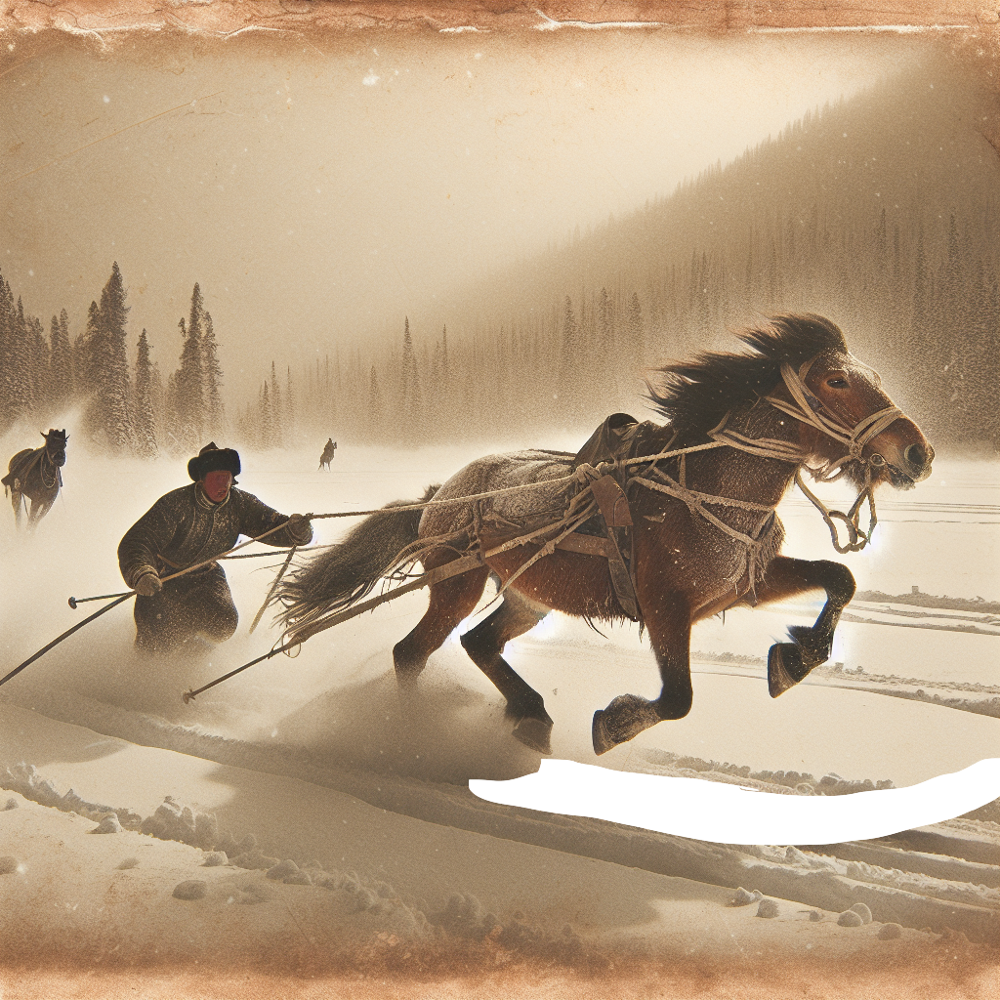

In [9]:
Image(skijoer_mask, width=256)

In [12]:
# Edit the masked image with OpenAI's DALL-E 2. Return value is an image URL.
res = openai.images.edit(
    image = skijoer,
    mask = skijoer_mask,
    prompt = "a horse running and pulling a skier in the snow",
    n=3
)

In [13]:
# Save the image into the current directory's 'image-edits' folder.
image_directory_name = "image-edits"
image_directory = os.path.join(os.curdir, image_directory_name)
if not os.path.isdir(image_directory):
    os.mkdir(image_directory)


image_filepath = os.path.join(image_directory, "skijoer-edit-1.png")
image_content = requests.get(res.data[0].url).content
with open(image_filepath, "wb") as image_file:
    image_file.write(image_content)

In [15]:
skijoer_edited = open("./image-edits/skijoer-edit-1.png", "rb").read()

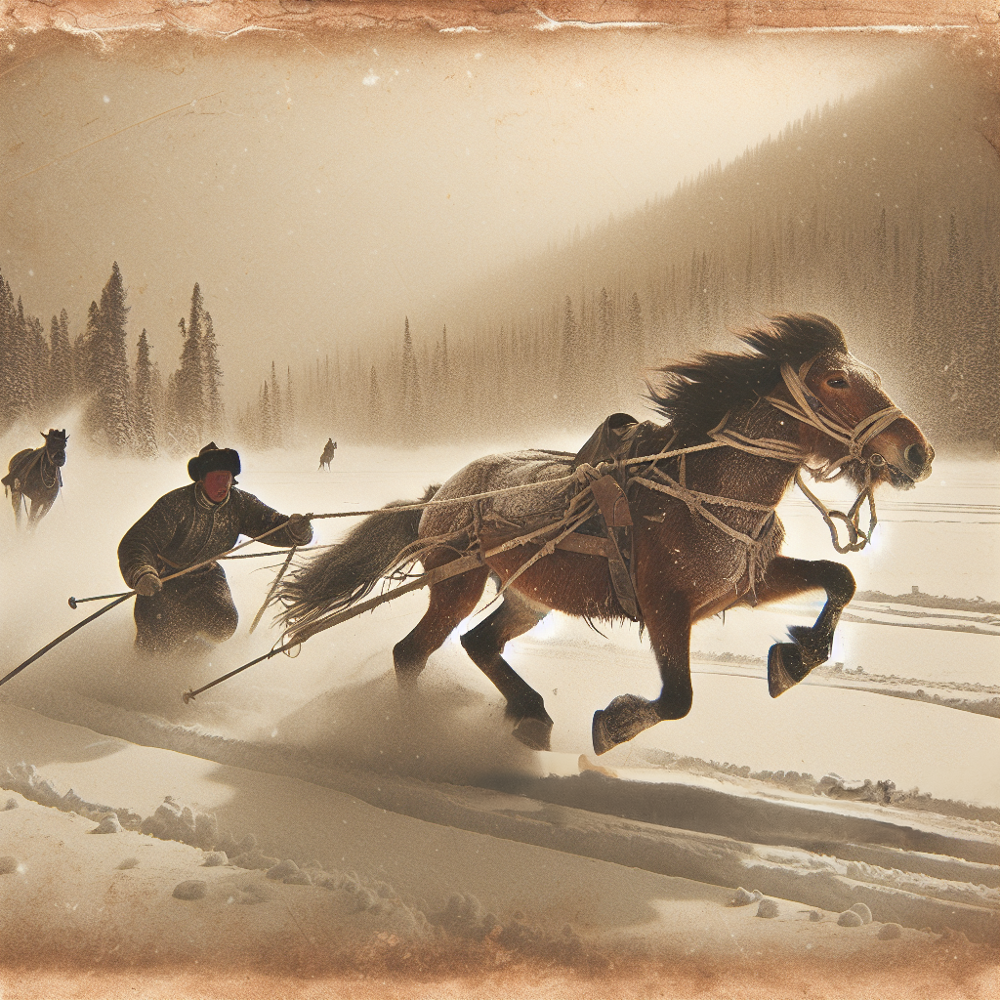

In [16]:
Image(skijoer_edited, width=256)

In [20]:
# Now let's improve the image by asking the AI to create visible skis for the man. For this, I first
# created a mask manually.
skijoer_mask_2 = open("./image-edits/skijoer-edit-1-mask.png", "rb").read()

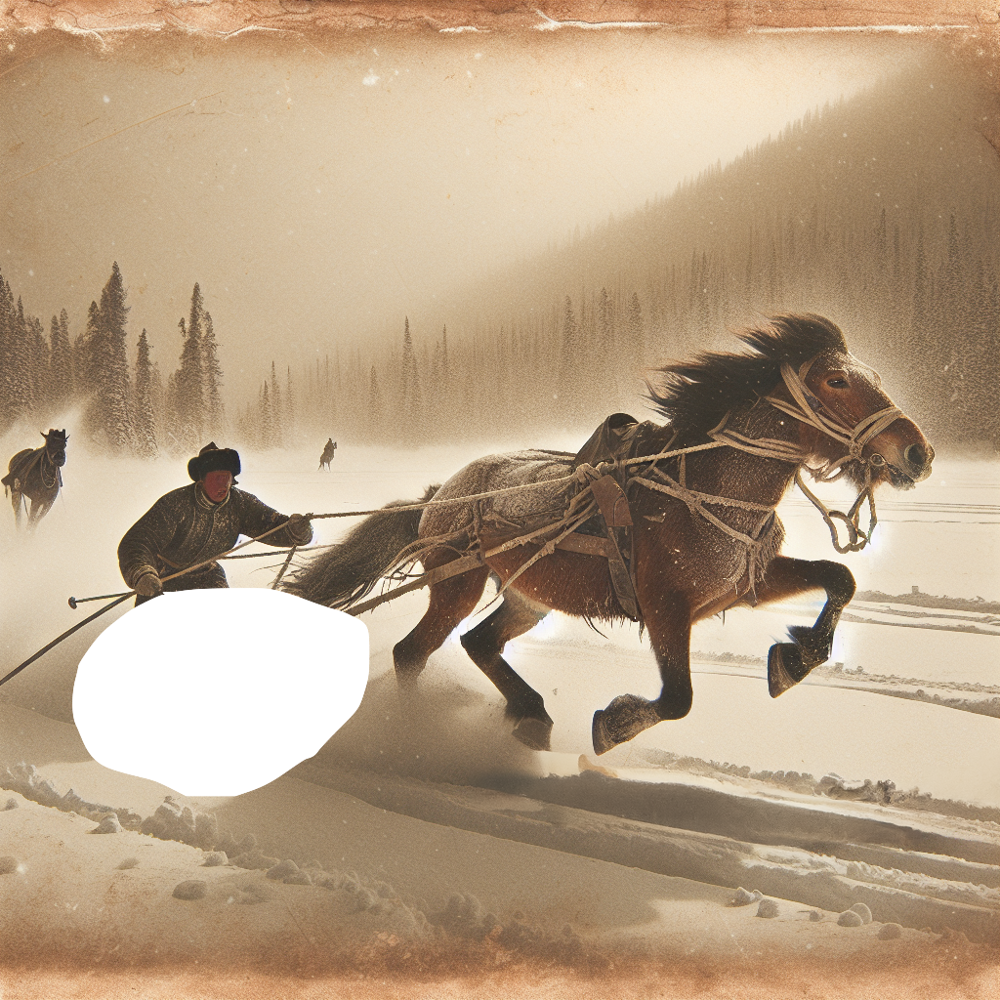

In [21]:
Image(skijoer_mask_2, width=256)

In [26]:
# Edit the masked image with OpenAI's DALL-E 2. Return value is an image URL.
res2 = openai.images.edit(
    image = skijoer_edited,
    mask = skijoer_mask_2,
    prompt = "a skiing man is pulled by a running horse",
    n=3
)

In [27]:
# Save the image into the current directory's 'image-edits' folder.
image_directory_name = "image-edits"
image_directory = os.path.join(os.curdir, image_directory_name)
if not os.path.isdir(image_directory):
    os.mkdir(image_directory)


image_filepath = os.path.join(image_directory, "skijoer-edit-4.png")
image_content = requests.get(res2.data[0].url).content
with open(image_filepath, "wb") as image_file:
    image_file.write(image_content)